<center> <font color = #82318E size = 5 face = "微软雅黑"> Violin Plot, the 1 st Homework of Data Visualization  </font> </center>

<center> <font color = #82318E size = 4 face = "微软雅黑"> 1. Prepare Data  </font> </center>

In [82]:
import os
import cv2
import colorsys
import imageio
import numpy as np
import matplotlib.pyplot as plt

<center> <font color = #82318E size = 3 face = "微软雅黑"> 1.1 Load Picture </font> </center>

<class 'numpy.ndarray'>
(3024, 4032, 3)
[180 255 255] [0 0 0]


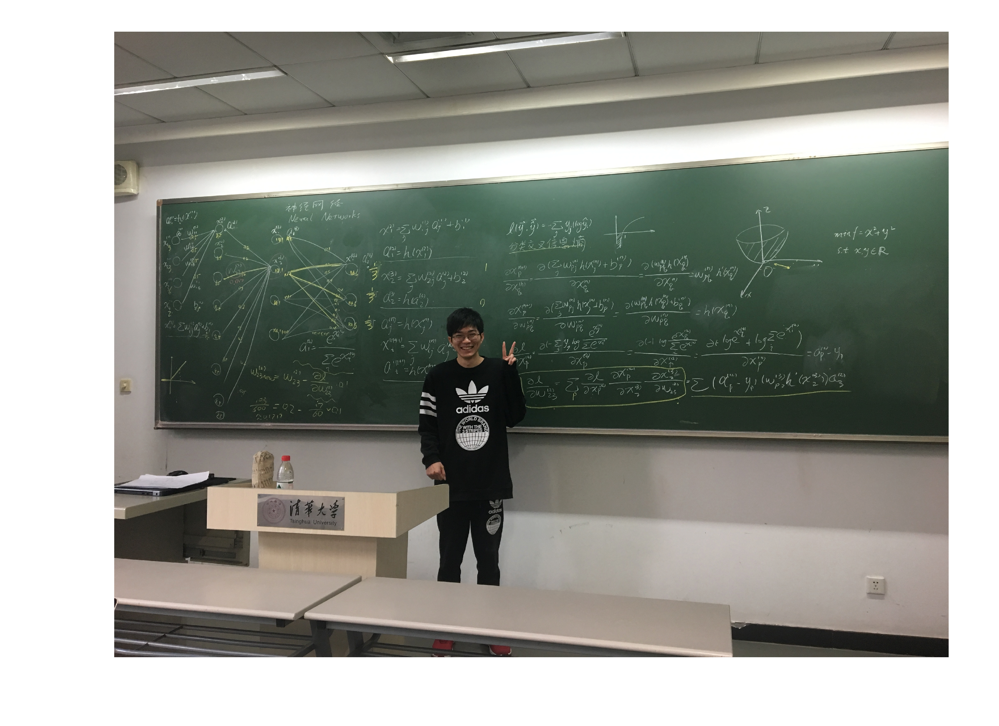

In [3]:
bgr_pic = cv2.imread('./BPAlgorithm.jpg')
hls_pic = cv2.cvtColor(bgr_pic, cv2.COLOR_BGR2HLS)

print(type(hls_pic))
print(hls_pic.shape)
print(np.max(hls_pic, axis = (0, 1)), np.min(hls_pic, axis = (0, 1)))

fig = plt.figure(dpi = 720)
ax = fig.add_subplot(111)
ax.imshow(cv2.cvtColor(hls_pic, cv2.COLOR_HLS2RGB))
ax.axis('off')
plt.show()

<center> <font color = #82318E size = 3 face = "微软雅黑"> 1.2 Process Data </font> </center>

In [59]:
'''
Flect original HLS data to [0, 1]
'''

standard_fallten_pic = hls_pic.reshape(-1, 3) / np.array([180, 255, 255])
print(standard_fallten_pic.shape)
print(np.max(standard_fallten_pic, axis = 0), np.min(standard_fallten_pic, axis = 0))

hs_standard_fallten_pic = standard_fallten_pic[::100, ::2]
hl_standard_fallten_pic = standard_fallten_pic[::100, :2:]
print(hs_standard_fallten_pic.shape)
print(hl_standard_fallten_pic.shape)

(12192768, 3)
[1. 1. 1.] [0. 0. 0.]
(121928, 2)
(121928, 2)


In [60]:
'''
Statistical Anlysis 
'''
bar_num = 18
bar_interval = np.linspace(0, 1, num = bar_num + 1)
bar = list()

print(bar_interval)
for i in np.arange(bar_num):
    bar.append(list())
print(bar)

[0.         0.05555556 0.11111111 0.16666667 0.22222222 0.27777778
 0.33333333 0.38888889 0.44444444 0.5        0.55555556 0.61111111
 0.66666667 0.72222222 0.77777778 0.83333333 0.88888889 0.94444444
 1.        ]
[[], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], [], []]


In [61]:
for i in np.arange(hs_standard_fallten_pic.shape[0]):
    for j in np.arange(bar_num):
        if ((hs_standard_fallten_pic[i, 0] >= bar_interval[j]) and (hs_standard_fallten_pic[i, 0] < bar_interval[j+1])):
            bar[j].append(hs_standard_fallten_pic[i, 1])
            break

In [62]:
for i in np.arange(len(bar)):
    bar[i] = np.array(bar[i])
    if bar[i].shape[0] == 0:
        bar[i] = np.array([0.5])
    print(bar[i].shape)
bar = np.array(bar)

(6179,)
(30706,)
(20821,)
(13638,)
(1147,)
(2685,)
(23146,)
(21065,)
(858,)
(415,)
(9,)
(312,)
(180,)
(80,)
(163,)
(82,)
(223,)
(217,)


<center> <font color = #82318E size = 4 face = "微软雅黑"> 2. Plot  </font> </center>

<center> <font color = #82318E size = 3 face = "微软雅黑"> 2.1 Histogram </font> </center>

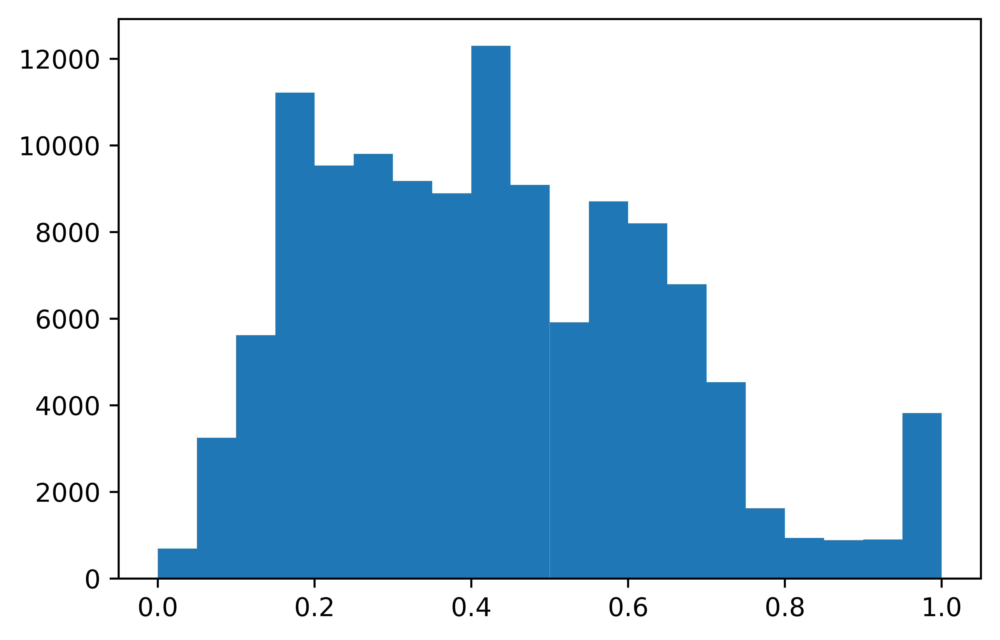

In [8]:
fig = plt.figure(dpi = 1080)
ax= fig.add_subplot(111)

ax.hist(x = hl_standard_fallten_pic[::, 1], bins = 20)

plt.savefig('./Question1.png')
plt.show()

<center> <font color = #82318E size = 3 face = "微软雅黑"> 2.2 Normal boxplot </font> </center>

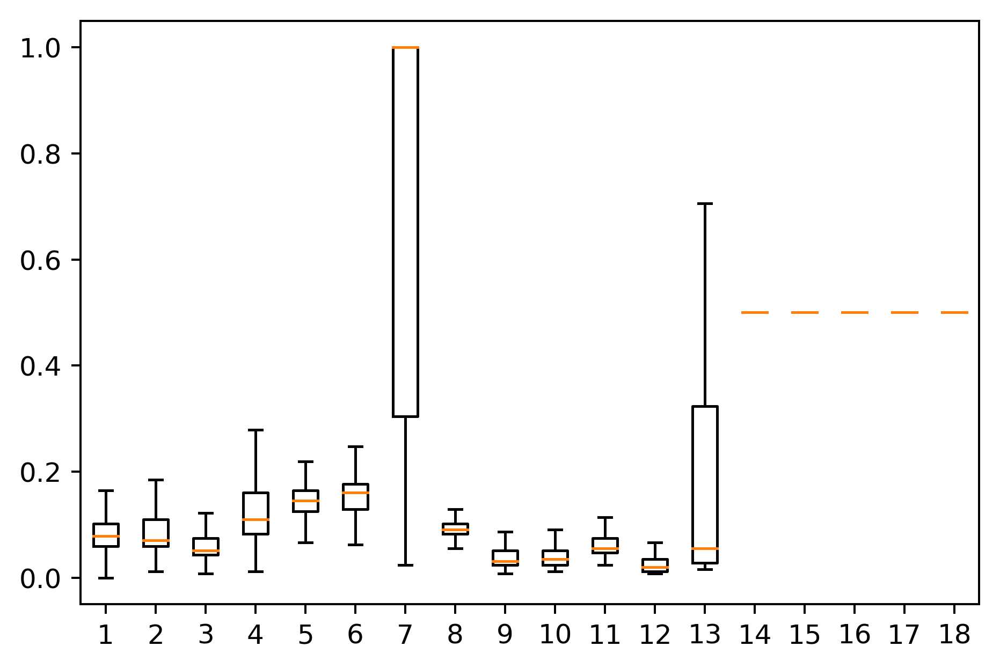

In [9]:
fig = plt.figure(dpi = 360)
ax = fig.add_subplot(111)

ax.boxplot(bar, showfliers=False)
plt.show()

<center> <font color = #82318E size = 3 face = "微软雅黑"> 2.3 Normal violin plot </font> </center>

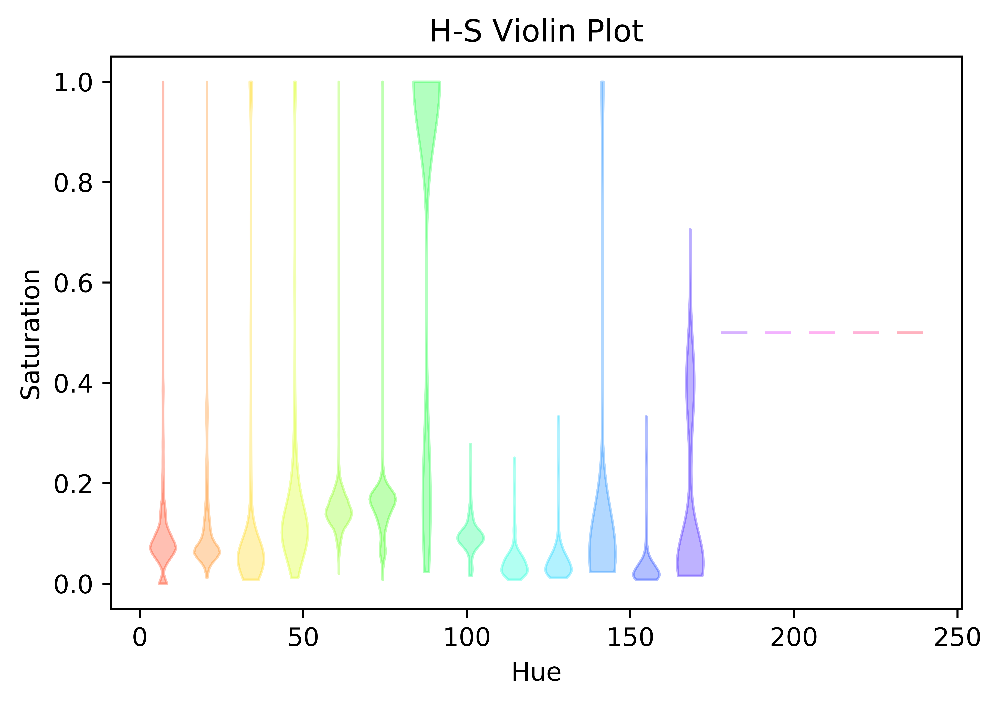

In [55]:
pos = np.linspace(128/bar_num, 256 - 128/bar_num, num = bar_num, endpoint = False)
hue_col = np.linspace(1/2 * 1/bar_num, 1 - 1/2 * 1/bar_num, num = bar_num, endpoint = True)
width = 8

'''
H-S
'''
fig = plt.figure(dpi = 1080)
ax = fig.add_subplot(111)

flatten_violin_plot = ax.violinplot(dataset = bar, positions = pos, widths = width, showextrema = False, showmeans = False, showmedians = False)
for i in np.arange(len(bar)):
    plt.setp(flatten_violin_plot['bodies'][i], color = colorsys.hls_to_rgb(hue_col[i], 0.5, 1))

ax.set_title('H-S Violin Plot')
ax.set_xlabel('Hue')
ax.set_ylabel('Saturation')

plt.savefig('./H_S Violin Plot.png')
plt.show()

'''
H-L
'''
'''
fig = plt.figure(dpi = 1080)
ax = fig.add_subplot(111)

flatten_violin_plot = ax.violinplot(dataset = bar, positions = pos, widths = width, showextrema = False, showmeans = False, showmedians = False)
for i in np.arange(len(bar)):
    plt.setp(flatten_violin_plot['bodies'][i], color = colorsys.hls_to_rgb(hue_col[i], 0.5, 1))

ax.set_title('H-L Violin Plot')
ax.set_xlabel('Hue')
ax.set_ylabel('Lightness')

plt.savefig('./H_L Violin Plot.png')
plt.show()
'''
print()

<center> <font color = #82318E size = 3 face = "微软雅黑"> 2.4 Polar violin plot </font> </center>

(18,)
<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


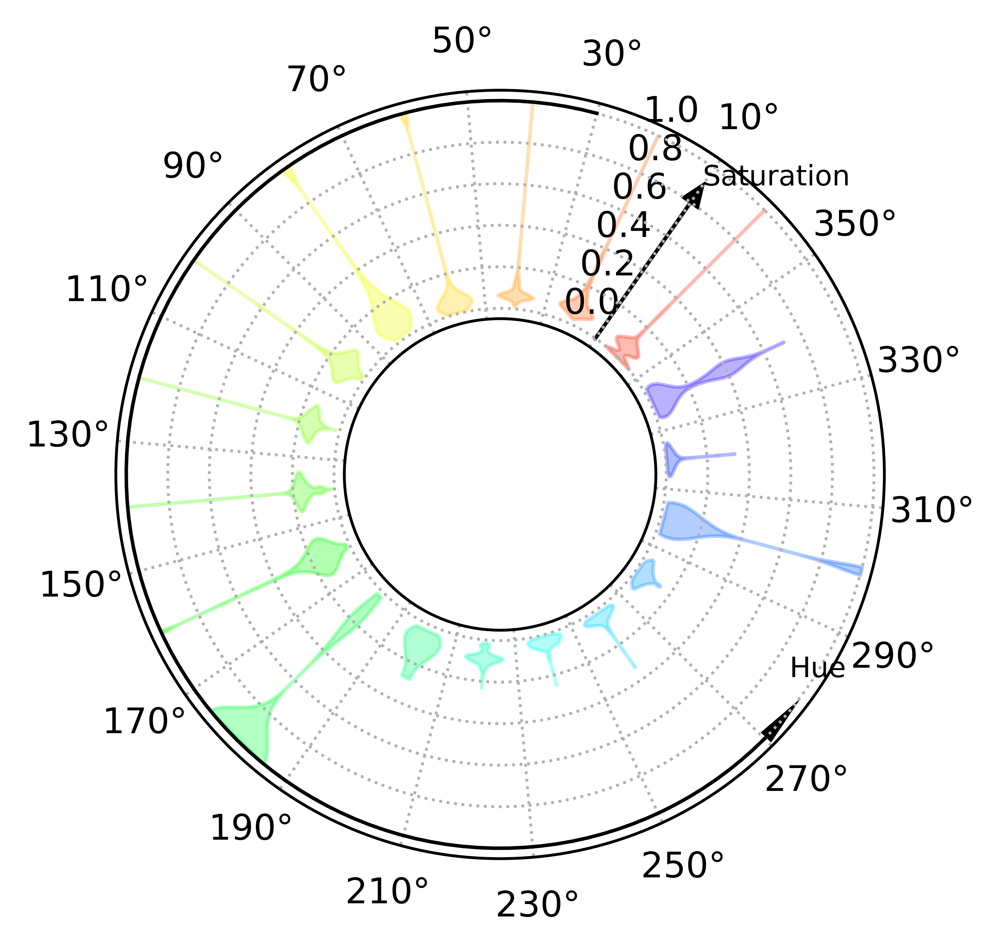

In [63]:
pos = np.linspace(0, 2 * np.pi, num = bar_num, endpoint = False)
hue_col = np.linspace(1/2 * 1/bar_num, 1 - 1/2 * 1/bar_num, num = bar_num, endpoint = True)

print(pos.shape)
fig = plt.figure(dpi = 1080)
ax = fig.add_subplot(111, projection = 'polar')

ax.set_rorigin(-0.8)
ax.set_theta_zero_location(loc = 'NE')
plt.thetagrids(np.linspace(180/bar_num, 360 - 180/bar_num, num = bar_num, endpoint = True))
plt.grid(b = True, linestyle = ':')
ax.arrow(np.pi/bar_num, 0, 0, 0.8, head_width = 0.05, head_length = 0.1, edgecolor = 'black', facecolor = 'black', linewidth = 1)
plt.text(np.pi/bar_num, 0.9, 'Saturation', color = 'black', size = 8)
ax.arrow(3/2*np.pi, 1, 1e-2, 0, head_width = 0.05, head_length = 0.1, edgecolor = 'black', facecolor = 'black')
plt.plot(np.linspace(3 * np.pi/bar_num, 3/2*np.pi, num = 100), np.tile(1, reps = (100, )), color = 'black', linewidth = 1)
plt.text(3/2*np.pi + np.pi/bar_num, 0.9, 'Hue', color = 'black', size = 8)

print(type(bar))
print(type(bar[0]))
polar_violin_plot = ax.violinplot(dataset = bar, positions = pos, widths = 0.2,
                                  showextrema = False, showmeans = False, showmedians = False)
for i in np.arange(len(bar)):
    plt.setp(polar_violin_plot['bodies'][i], color = colorsys.hls_to_rgb(hue_col[i] * 180/255, 0.5, 1))

plt.savefig('./Polar_After.png')
plt.show()

<center> <font color = #82318E size = 3 face = "微软雅黑"> 2.5 GIF </font> </center>

In [87]:
def GIF_Violin(width):
    pos = np.linspace(128/bar_num, 256 - 128/bar_num, num = bar_num, endpoint = False)
    hue_col = np.linspace(1/2 * 1/bar_num, 1 - 1/2 * 1/bar_num, num = bar_num, endpoint = True)

    fig = plt.figure(dpi = 1080)
    ax = fig.add_subplot(111)

    flatten_violin_plot = ax.violinplot(dataset = bar, positions = pos, widths = width, showextrema = False, showmeans = False, showmedians = False)
    for i in np.arange(len(bar)):
        plt.setp(flatten_violin_plot['bodies'][i], color = colorsys.hls_to_rgb(hue_col[i]*180/255, 0.5, 1))

    ax.set_title('H-S Violin Plot')
    ax.set_xlabel('Hue')
    ax.set_ylabel('Saturation')

    plt.savefig('./GIF/H_S Violin Plot_{0:02d}.png'.format(width))
    plt.show()

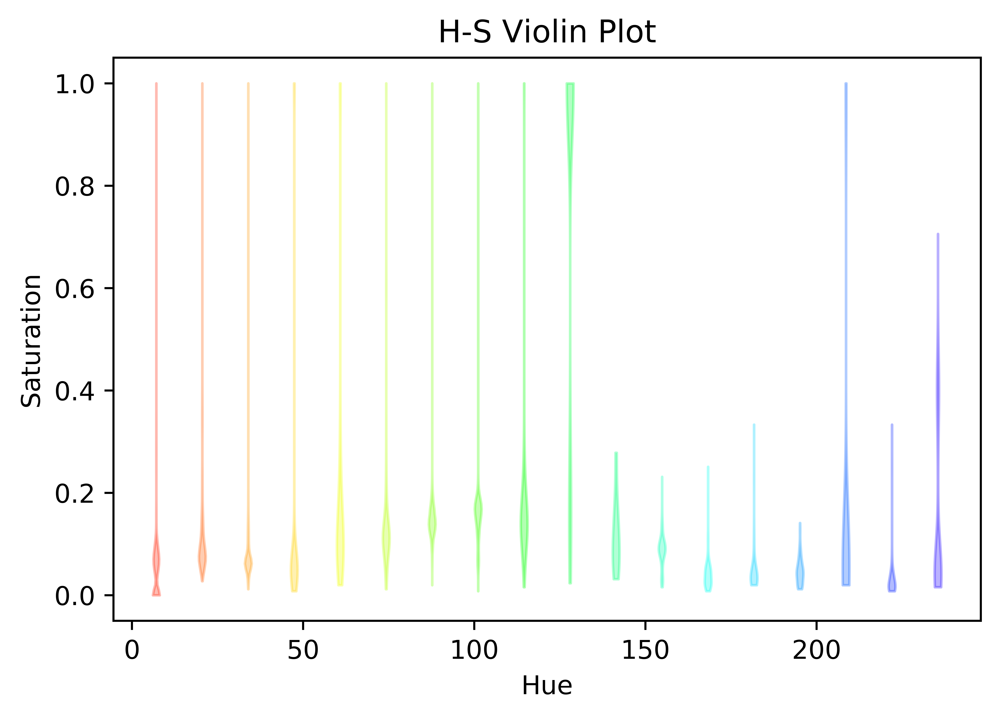

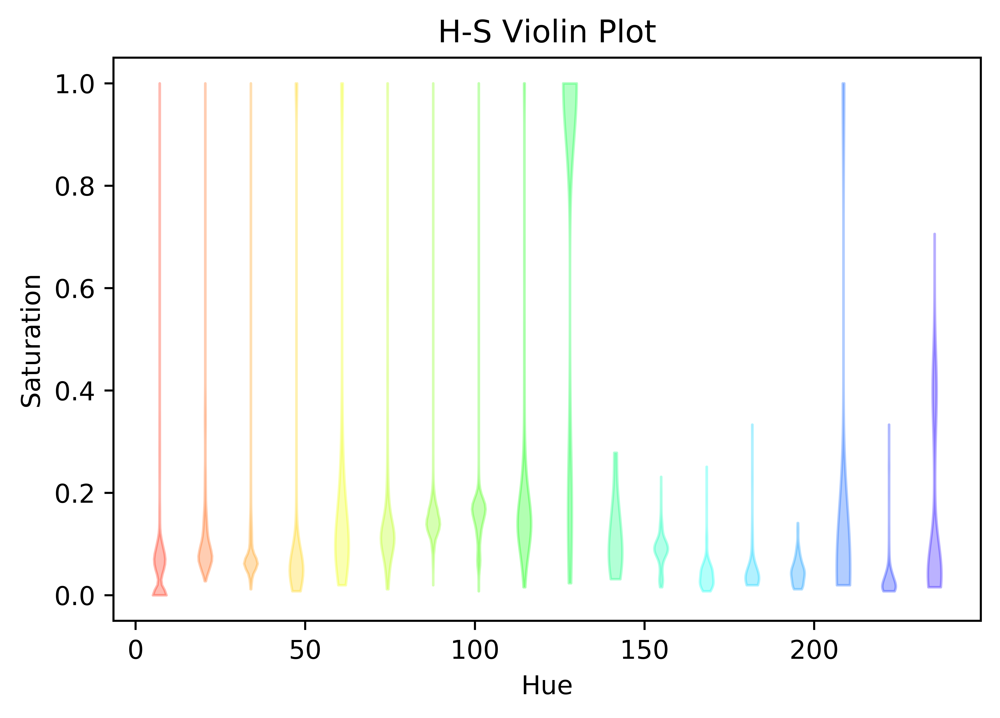

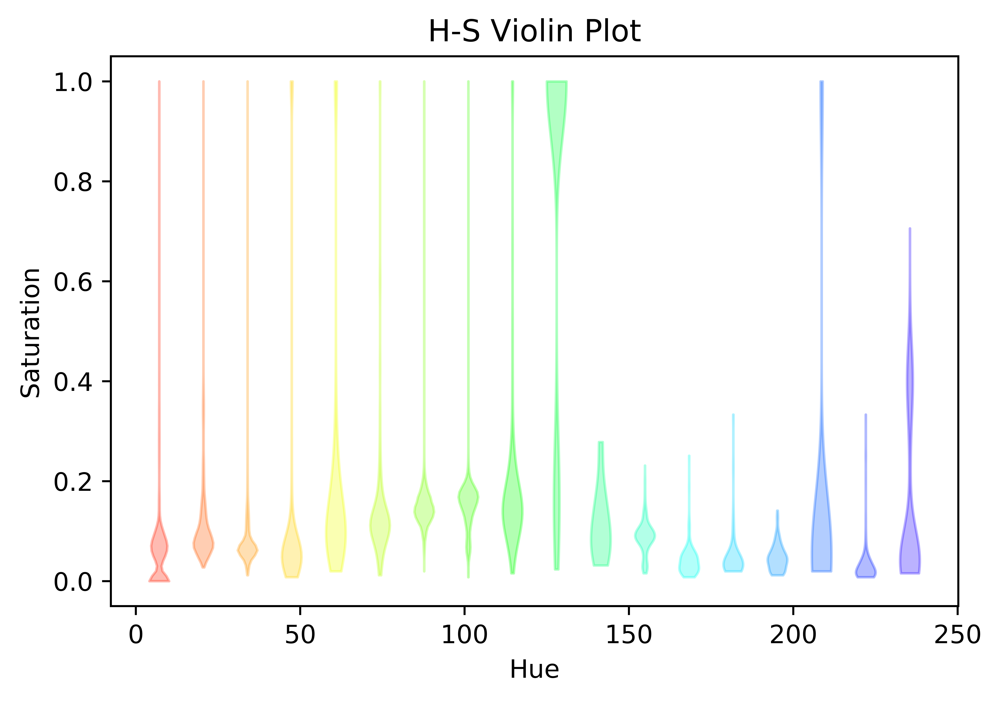

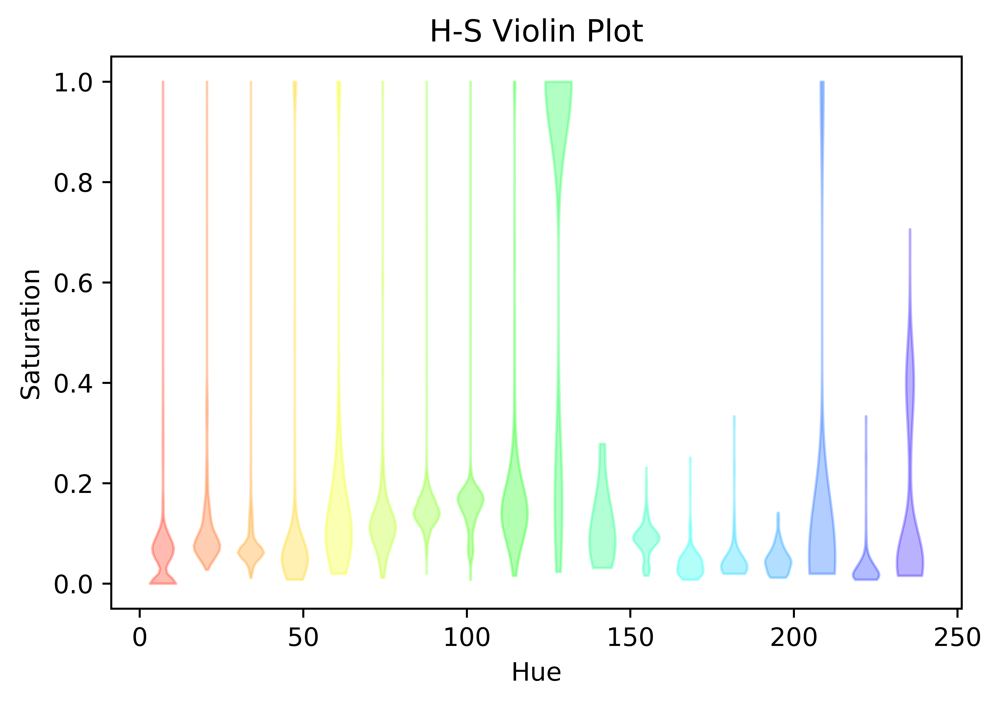

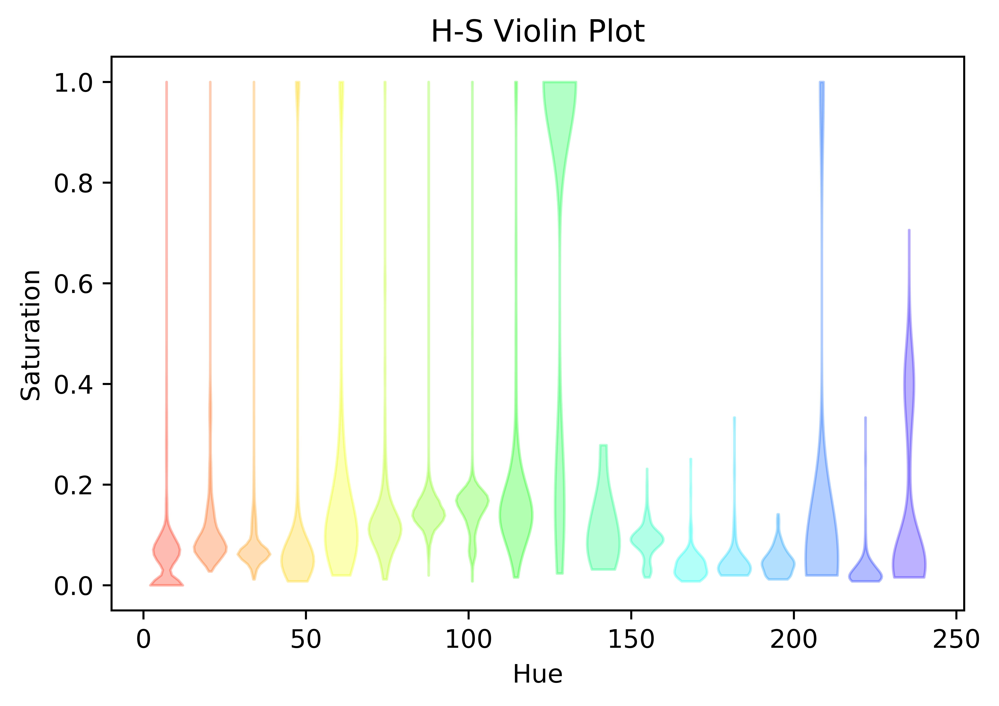

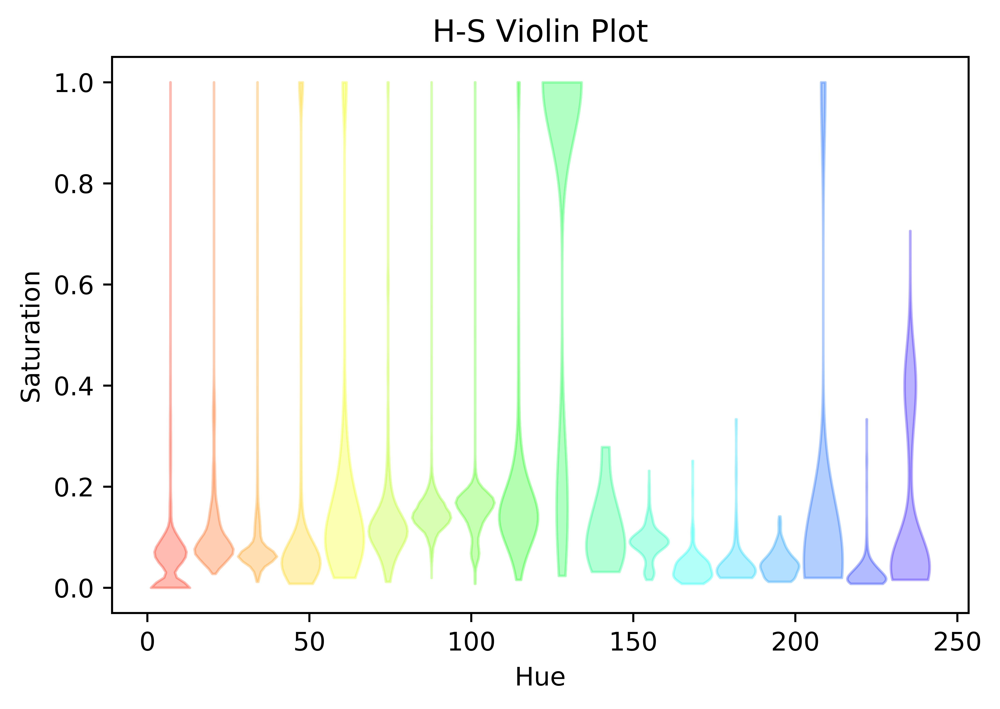

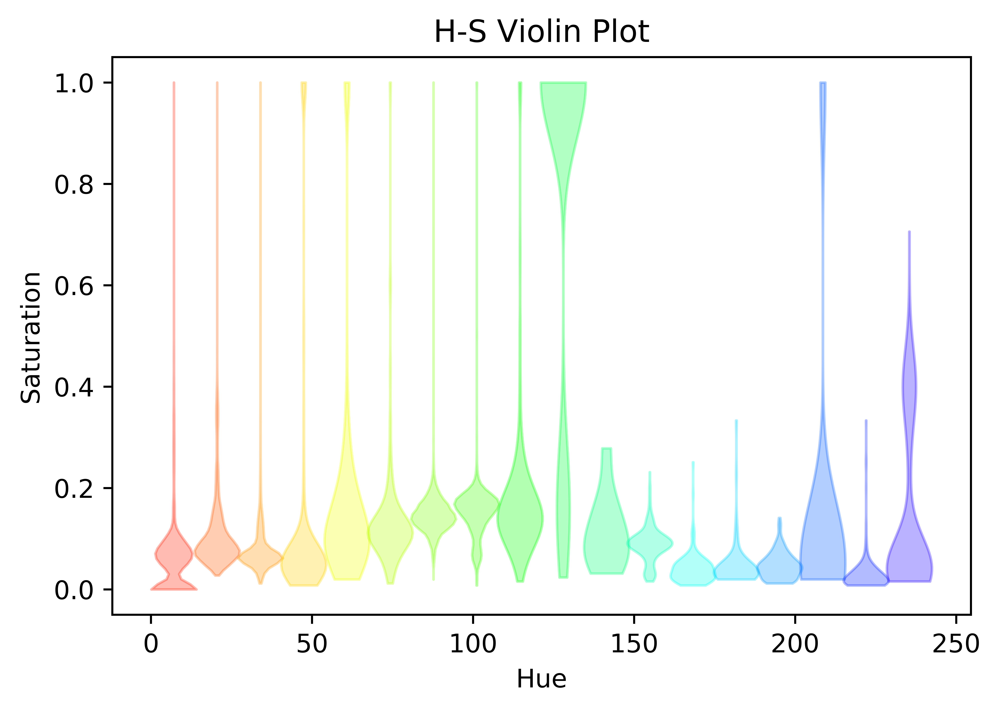

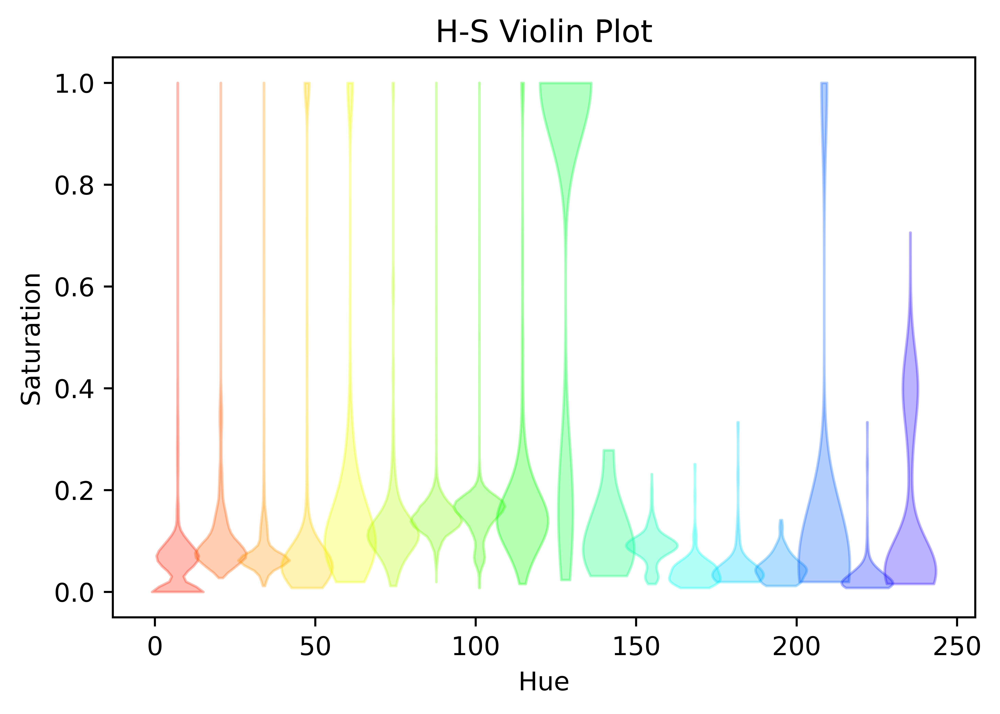

In [88]:
for i in np.arange(2, 17, 2):
    GIF_Violin(i)

In [89]:
png_list = list()
temp_list = os.listdir('./GIF/')
print(temp_list)
for i in np.arange(len(temp_list)):
    png_list.append(imageio.imread('./GIF/{}'.format(temp_list[i])))

['H_S Violin Plot_02.png', 'H_S Violin Plot_04.png', 'H_S Violin Plot_06.png', 'H_S Violin Plot_08.png', 'H_S Violin Plot_10.png', 'H_S Violin Plot_12.png', 'H_S Violin Plot_14.png']


In [90]:
imageio.mimsave('./Combination.gif', png_list, 'GIF', duration = 1)